<a href="https://colab.research.google.com/github/mschoder/sugarcane-weed-classification/blob/master/models/Detectron_FasterRCNN_R101.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# install dependencies: 
!pip install pyyaml==5.1 'pycocotools>=2.0.1'
!pip install torch==1.6.0+cu101 torchvision==0.7.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html

import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

     |████████████████████████████████| 276kB 9.2MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44075 sha256=66693c59177b19c1429e29e086c1e6be26fc155670ab6e316bdca53c9d1547ad
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 708.0MB 26kB/s 
     |████████████████████████████████| 5.9MB 59.8MB/s 
  Found existing installation: torch 1.7.0+cu101
    Uninstalling torch-1.7.0+cu101:
      Successfully uninstalled torch-1.7.0+cu101
  Found existing installation: torchvision 0.8.1+cu101
    Uninstalling torchvision-0.8.1+cu101:
      Successfully uninstalled torchvision-0.8.1+cu101
1.6.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C)

In [2]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.6)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
assert torch.__version__.startswith("1.6")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
     |████████████████████████████████| 6.6MB 631kB/s 
     |████████████████████████████████| 2.2MB 6.0MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.2.post20201104-cp36-none-any.whl size=44419 sha256=06b3bd26b8372027bdd710ebcfd978004a5593f61b9167a39501625adf0cee40
  Stored in directory: /root/.cache/pip/wheels/ec/4d/40/4077356fe02ef345791713eabede5ed63afe7d613b016694d1
Successfully built fvcore
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0


In [1]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [2]:
# Install gcsfuse to access gcp bucket directly
!echo "deb http://packages.cloud.google.com/apt gcsfuse-bionic main" > /etc/apt/sources.list.d/gcsfuse.list
!curl https://packages.cloud.google.com/apt/doc/apt-key.gpg | apt-key add -
!apt -qq update
!apt -qq install gcsfuse

# Log in for GCP bucket access
from google.colab import auth
auth.authenticate_user()

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   653  100   653    0     0  23321      0 --:--:-- --:--:-- --:--:-- 24185
OK
40 packages can be upgraded. Run 'apt list --upgradable' to see them.
The following NEW packages will be installed:
  gcsfuse
0 upgraded, 1 newly installed, 0 to remove and 40 not upgraded.
Need to get 10.7 MB of archives.
After this operation, 22.9 MB of additional disk space will be used.
Selecting previously unselected package gcsfuse.
(Reading database ... 144628 files and directories currently installed.)
Preparing to unpack .../gcsfuse_0.32.0_amd64.deb ...
Unpacking gcsfuse (0.32.0) ...
Setting up gcsfuse (0.32.0) ...


In [3]:
# Connect to gcp data bucket
!mkdir data
!gcsfuse --implicit-dirs crop-weed-bucket data 

# Verify acces
!ls data/

Using mount point: /content/data
Opening GCS connection...
Mounting file system...
File system has been successfully mounted.
bounding_boxes	jpg_images_allweeds  raw_images


In [4]:
from detectron2.structures import BoxMode

def get_weed_dicts(img_dir, file_list):
    json_file = os.path.join(img_dir, "weed_labels.json")
    with open(json_file) as f:
        img_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(img_anns.values()):
        if v["filename"] in file_list:  # train or test data
            record = {}
            filename = os.path.join(img_dir, v["filename"])
            height, width = cv2.imread(filename).shape[:2]

            record["file_name"] = filename
            record["image_id"] = idx
            record["height"] = height
            record["width"] = width

            annos = v["regions"]   # List of object attributes
            objs = []
            for anno in annos:
                if anno["region_attributes"]["label"] == "weed":
                    sa = anno["shape_attributes"]
                    obj = {
                        "bbox": [sa['x'], sa['y'], sa['width'], sa['height']],
                        "bbox_mode": BoxMode.XYWH_ABS, # or XYXY_ABS
                        "category_id": 0 if anno["region_attributes"]["label"] == "weed" else 1
                    }
                    objs.append(obj)
            record["annotations"] = objs
            dataset_dicts.append(record)
    return dataset_dicts


In [5]:
# Create and register datasets
img_dir = 'data/jpg_images_allweeds/'
json_file = os.path.join(img_dir, "weed_labels.json")
with open(json_file) as f:
    img_anns = json.load(f)

file_list = sorted([k for k in img_anns.keys()])
print("Number of images: ", len(file_list))
np.random.seed(21)
np.random.shuffle(file_list)
val_pct = 0.3
file_lists = {
    "val": file_list[:int(val_pct * len(file_list))],
    "train": file_list[int(val_pct * len(file_list)):]
}

DatasetCatalog.clear()
for d in ["train", "val"]:
    DatasetCatalog.register("weeds_" + d, lambda d=d: get_weed_dicts(img_dir, file_lists[d]))
    MetadataCatalog.get("weeds_" + d).set(thing_classes=["weed"])
weeds_metadata = MetadataCatalog.get("weeds_train")

# Build full dict
dataset_dicts = get_weed_dicts(img_dir, file_lists['train'])

Number of images:  285


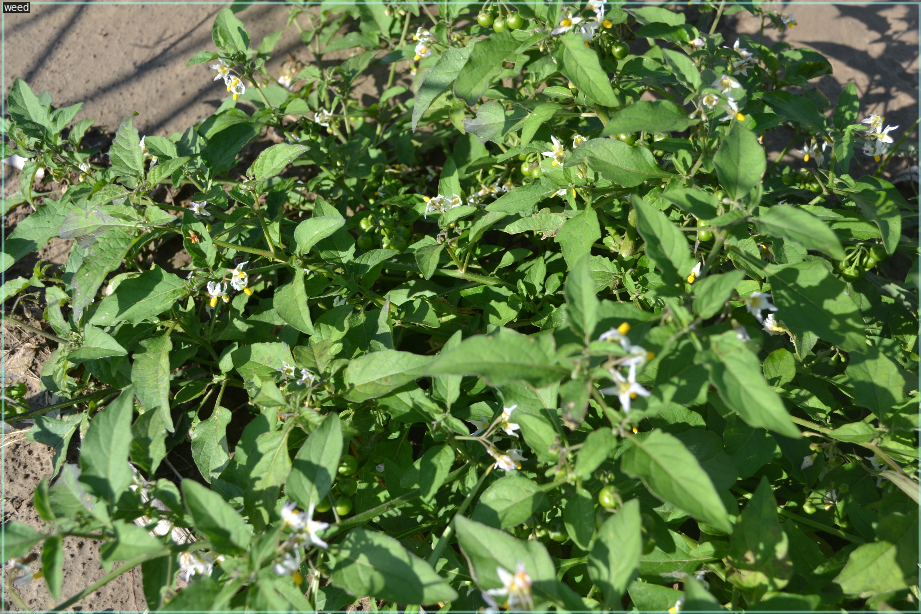

In [6]:
# Verify labels
for d in random.sample(dataset_dicts, 1):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=weeds_metadata, scale=0.2)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])


In [7]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("weeds_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.0025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1200    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (weed). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()


[11/05 03:52:43 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:17, 23.7MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.


[11/05 03:54:09 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/detectron2/layers/wrappers.py:226: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  return x.nonzero().unbind(1)


[11/05 03:55:21 d2.utils.events]:  eta: 1:03:06  iter: 19  total_loss: 1.056  loss_cls: 0.581  loss_box_reg: 0.123  loss_rpn_cls: 0.293  loss_rpn_loc: 0.044  time: 3.3204  data_time: 0.4657  lr: 0.000050  max_mem: 10297M
[11/05 03:56:36 d2.utils.events]:  eta: 1:08:43  iter: 39  total_loss: 0.798  loss_cls: 0.285  loss_box_reg: 0.239  loss_rpn_cls: 0.171  loss_rpn_loc: 0.060  time: 3.5499  data_time: 0.1944  lr: 0.000100  max_mem: 10297M
[11/05 03:57:48 d2.utils.events]:  eta: 1:07:48  iter: 59  total_loss: 0.549  loss_cls: 0.199  loss_box_reg: 0.189  loss_rpn_cls: 0.070  loss_rpn_loc: 0.050  time: 3.5692  data_time: 0.1442  lr: 0.000150  max_mem: 10297M
[11/05 03:59:05 d2.utils.events]:  eta: 1:08:14  iter: 79  total_loss: 0.564  loss_cls: 0.227  loss_box_reg: 0.240  loss_rpn_cls: 0.056  loss_rpn_loc: 0.043  time: 3.6320  data_time: 0.2360  lr: 0.000200  max_mem: 10297M
[11/05 04:00:19 d2.utils.events]:  eta: 1:07:33  iter: 99  total_loss: 0.511  loss_cls: 0.207  loss_box_reg: 0.232  

In [8]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [9]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.3   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

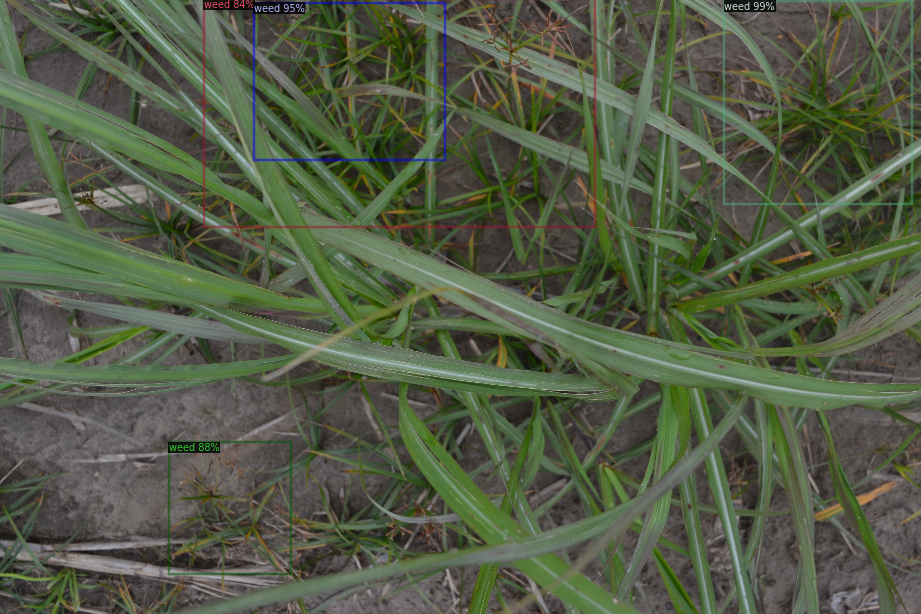

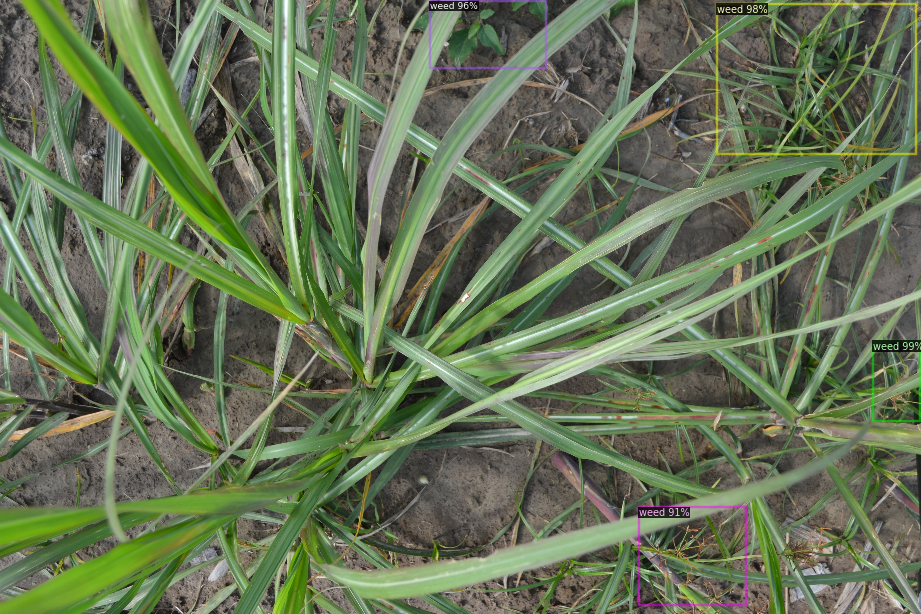

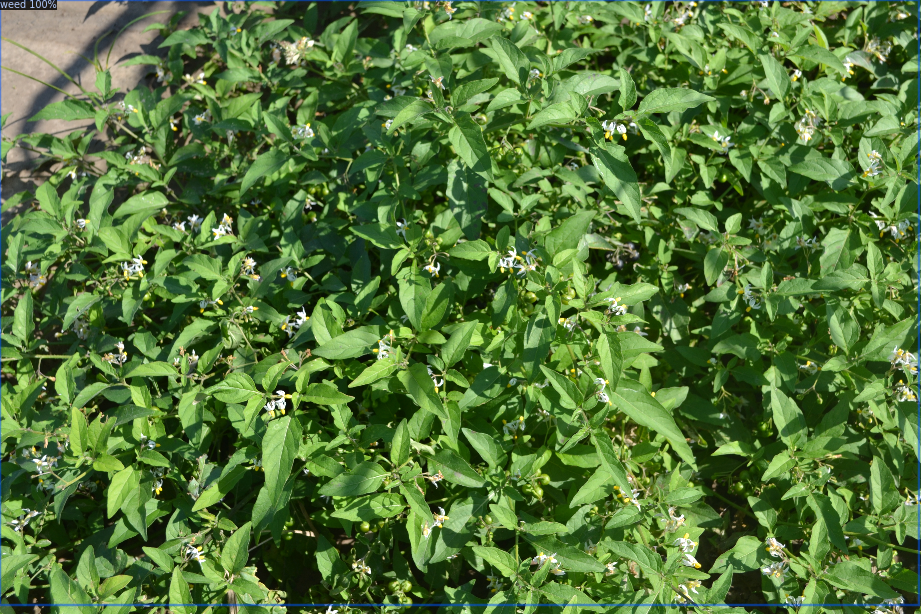

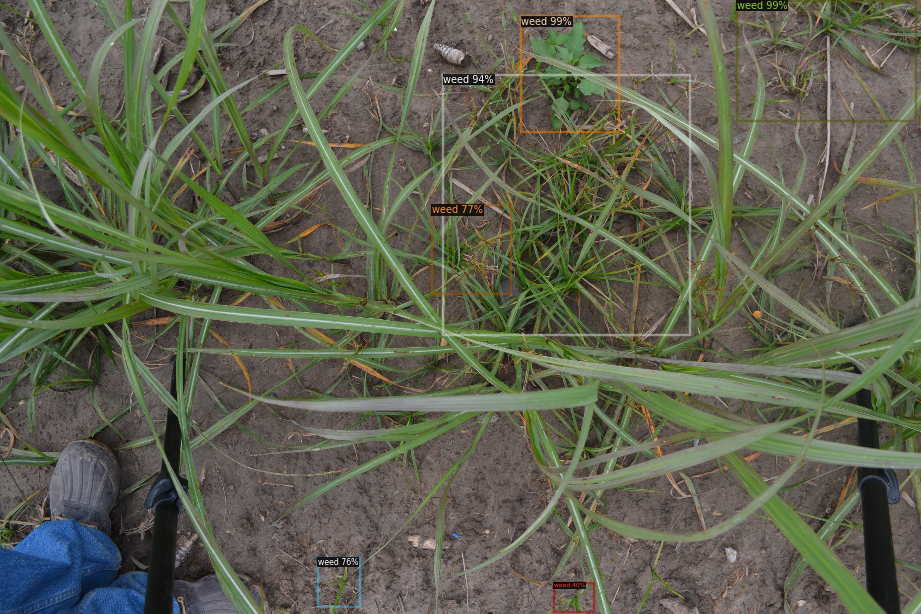

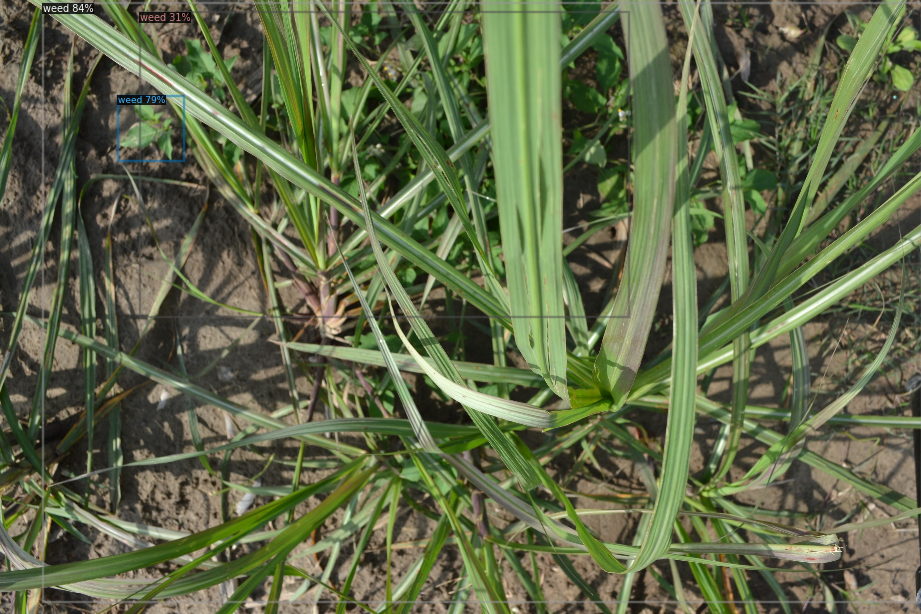

In [15]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_weed_dicts(img_dir, file_lists['val'])
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=weeds_metadata, 
                   scale=0.2, 
                   instance_mode=ColorMode.IMAGE   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [11]:
outputs

{'instances': Instances(num_instances=6, image_height=4608, image_width=3072, fields=[pred_boxes: Boxes(tensor([[  36.1037, 2745.9854,  577.3622, 3117.9631],
         [2469.7598, 3342.7278, 3061.9626, 4589.8701],
         [2276.4771,   39.7659, 3048.5205,  694.0425],
         [   9.3016,  441.0582,  322.3141, 1239.1699],
         [2608.5581,  619.1288, 2819.6990,  870.2156],
         [  49.3711,  333.2044,  711.9348, 1229.7114]], device='cuda:0')), scores: tensor([0.9949, 0.9853, 0.9827, 0.9468, 0.7779, 0.5499], device='cuda:0'), pred_classes: tensor([0, 0, 0, 0, 0, 0], device='cuda:0')])}

In [12]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("weeds_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "weeds_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[11/05 05:08:36 d2.evaluation.coco_evaluation]: 'weeds_val' is not registered by `register_coco_instances`. Therefore trying to convert it to COCO format ...
[11/05 05:08:36 d2.data.datasets.coco]: Converting annotations of dataset 'weeds_val' to COCO format ...)
[11/05 05:09:02 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[11/05 05:09:02 d2.data.datasets.coco]: Conversion finished, #images: 85, #annotations: 319
[11/05 05:09:02 d2.data.datasets.coco]: Caching COCO format annotations at './output/weeds_val_coco_format.json' ...
[11/05 05:09:26 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    weed    | 319          |
|            |              |
[11/05 05:09:26 d2.data.common]: Serializing 85 elements to byte tensors and concatenating them all ...
[11/05 05:09:26 d2.data.common]: Serialized dataset takes 0.02 MiB
[11/05 05:09:26 d2.data.dataset_mapper]: Augmentations used in training: